# Подготовка набора данных

Подготовка библиотек и отключение предупреждений

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

# Импорт библиотеки
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

sns.set_theme()

Подключений Google Drive к блокноту Google Colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Загрузка набора данных

Набор данных, используемый в лабораторных работах доступен по [ссылке](https://www.kaggle.com/datasets/mssmartypants/paris-housing-classification)

Поскольку работы выполнены в среде Google Colaboratory, путь до файла указывается относительно директории, к которой примонтирован Google диск

In [ ]:
ParisHousingClass_df = pd.read_csv('/content/drive/MyDrive/ParisHousingClass.csv')
ParisHousingClass_df.category = ParisHousingClass_df.category.astype('category')
ParisHousingClass_df.head()

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price,category
0,75523,3,0,1,63,9373,3,8,2005,0,1,4313,9005,956,0,7,7559081.5,Basic
1,80771,39,1,1,98,39381,8,6,2015,1,0,3653,2436,128,1,2,8085989.5,Luxury
2,55712,58,0,1,19,34457,6,8,2021,0,0,2937,8852,135,1,9,5574642.1,Basic
3,32316,47,0,0,6,27939,10,4,2012,0,1,659,7141,359,0,3,3232561.2,Basic
4,70429,19,1,1,90,38045,3,7,1990,1,0,8435,2429,292,1,4,7055052.0,Luxury


Отделяем целевые классы

In [ ]:
X = ParisHousingClass_df.drop(['category'], axis=1)
y_true = ParisHousingClass_df.category

In [ ]:
n_classes = y_true.nunique()
max_clusters = n_classes + 4
classes = y_true.unique()
y_true.value_counts()

,count
category,
Basic,8735
Luxury,1265


# Кластеризация

## Определение оптимального количества кластеров

Для поиска оптимального количества кластеров используем `elbow method` (`метод локтя`)

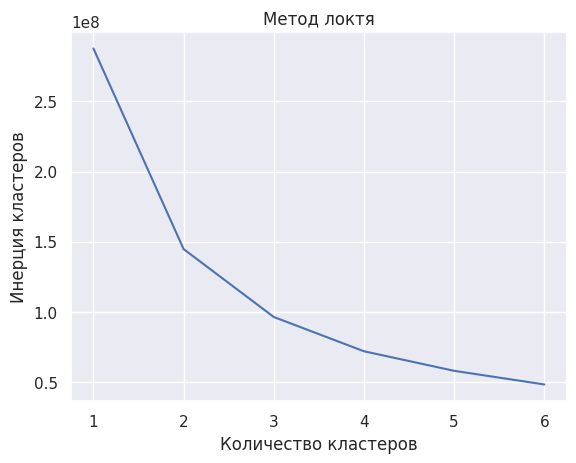

In [ ]:
from sklearn.cluster import KMeans


inertia_log = []
for n_clusters in range(1, max_clusters + 1):
    model = KMeans(n_clusters=n_clusters, n_init=100, random_state=69)
    model.fit(X)
    inertia_log.append(model.inertia_)

inertia_log = np.sqrt(inertia_log)
sns.lineplot(x=range(1, max_clusters + 1), y=inertia_log)
plt.title('Метод локтя')
plt.xlabel('Количество кластеров')
plt.ylabel('Инерция кластеров')
plt.show()

Отследим момент, после которого увеличение количества кластеров перестало существенно влиять

<Axes: >

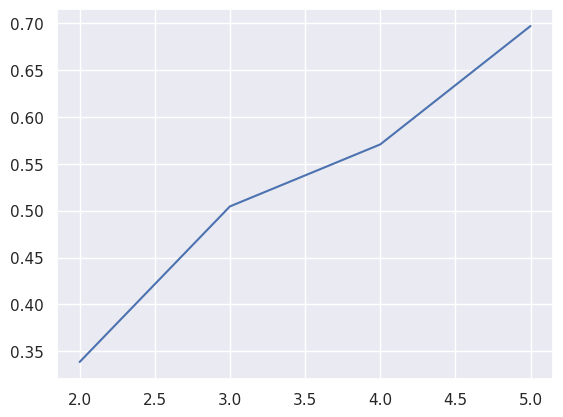

In [ ]:
modifier = []
for i in range(1, max_clusters - 1):
    modifier.append((inertia_log[i] - inertia_log[i + 1]) / (inertia_log[i - 1] - inertia_log[i]))

sns.lineplot(x=range(2, max_clusters), y=modifier)

2 кластера - оптимальное количество, которое возможно обучить с помощью `KMeans`

## Обучение модели кластеризации для оптимального количества кластеров

In [ ]:
model = KMeans(n_clusters=np.argmin(modifier) + 2, n_init=100, random_state=69)
y_model = model.fit_predict(X)

## Визуализация результатов

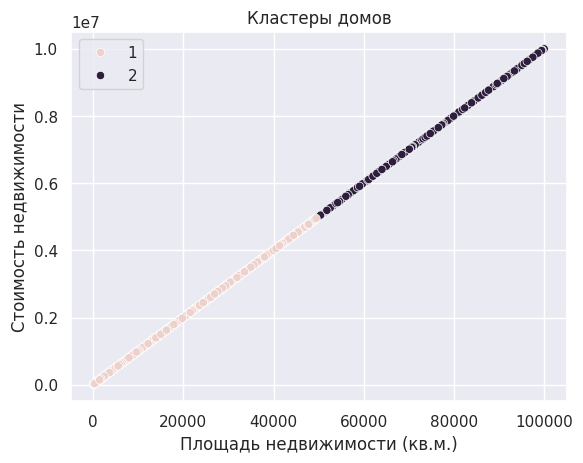

In [ ]:
sns.scatterplot(x=X.squareMeters, y=X.price, hue=y_model + 1)

plt.title('Кластеры домов')
plt.xlabel('Площадь недвижимости (кв.м.)')
plt.ylabel('Стоимость недвижимости')
plt.show()

In [ ]:
X_clustered = X.copy()
X_clustered['cluster'] = y_model + 1
X_clustered

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price,cluster
0,75523,3,0,1,63,9373,3,8,2005,0,1,4313,9005,956,0,7,7559081.5,2
1,80771,39,1,1,98,39381,8,6,2015,1,0,3653,2436,128,1,2,8085989.5,2
2,55712,58,0,1,19,34457,6,8,2021,0,0,2937,8852,135,1,9,5574642.1,2
3,32316,47,0,0,6,27939,10,4,2012,0,1,659,7141,359,0,3,3232561.2,1
4,70429,19,1,1,90,38045,3,7,1990,1,0,8435,2429,292,1,4,7055052.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1726,89,0,1,5,73133,7,6,2009,0,1,9311,1698,218,0,4,176425.9,1
9996,44403,29,1,1,12,34606,9,4,1990,0,1,9061,1742,230,0,0,4448474.0,1
9997,83841,3,0,0,69,80933,10,10,2005,1,1,8304,7730,345,1,9,8390030.5,2
9998,59036,70,0,0,96,55856,1,3,2010,0,1,2590,6174,339,1,4,5905107.0,2


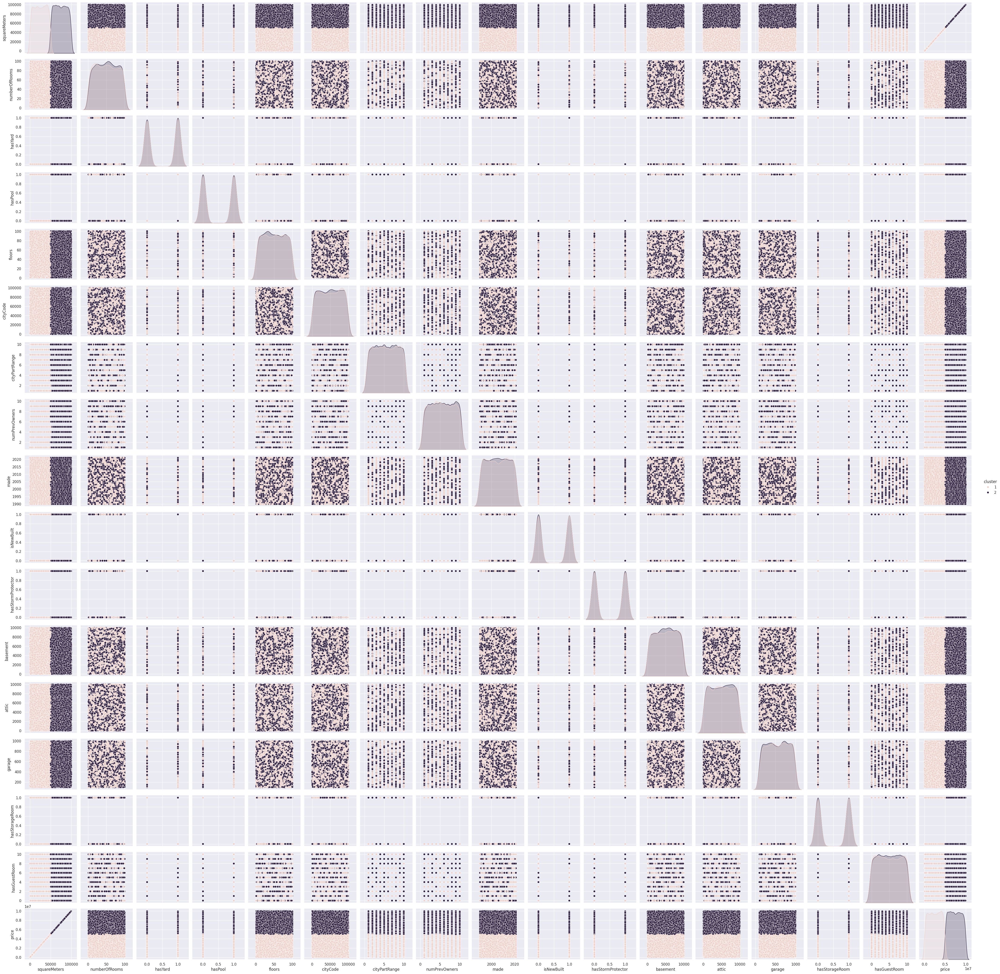

In [ ]:
sns.pairplot(X_clustered, hue='cluster')